$\Large\color{blue}{\text{PyGMTSAR 2020 Ardabil, Iran Earthquake Co-Seismic Interferogram}}$

$\Large\color{blue}{\text{Sentinel-1 Scenes Downloading from Alaska Satellite Facility (ASF)}}$

See https://www.emsc-csem.org/Earthquake/Gallery/maps.php?id=830280 and https://earthquaketrack.com/quakes/2020-02-15-21-45-42-utc-4-3-10

### Look for more PyGMTSAR examples:

* Google Colab - see GitHub page for [notebooks](https://github.com/mobigroup/gmtsar),

* Docker Images on [DockerHub](https://hub.docker.com/r/mobigroup/pygmtsar),

* GitHub [notebooks](https://github.com/mobigroup/gmtsar/tree/master/notebooks),

* GitHub Actions [console scripts](https://github.com/mobigroup/gmtsar/actions),

* Google Cloud VM -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/),

* Linux Debian and Ubuntu -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/),

* Apple Silicon and Intel hosts -  follow [PyGMTSAR documentation](https://mobigroup.github.io/gmtsar/).


### PyGMTSAR InSAR library, Geomed3D Geophysical Inversion Library, N-Cube 3D/4D GIS Data Visualization, etc. are my free-time Open Source projects.

I have STEM master’s degree in radio physics and in 2004 I have got the first prize of the All-Russian Physics competition for significant results in forward and inverse modeling for non-linear optics and holography, also applicable for modeling of Gravity, Magnetic, and Thermal fields and satellite interferometry processing. And I’m data scientist and software developer with 20 year’s experience in science and industrial development. I had been working on government contracts and universities projects and on projects for LG Corp, Google Inc, etc.

### You can sponsor my work on [Patreon](https://www.patreon.com/pechnikov) where I share my projects updates, publications, use cases, examples, and other useful information. To order some research and development and support, see my profile on freelance platform [Upwork](https://www.upwork.com/freelancers/~01e65e8e7221758623). 

### Resources

* [Patreon](https://www.patreon.com/pechnikov),

* [YouTube Geological Models](https://www.youtube.com/channel/UCSEeXKAn9f_bDiTjT6l87Lg),

* [Virtual and Augmented Reality (VR/AR) Geological Models](https://mobigroup.github.io/ParaView-Blender-AR/),

* [GitHub](https://github.com/mobigroup),

* [LinkedIn](https://www.linkedin.com/in/alexey-pechnikov/),

* [Medium](https://medium.com/@pechnikov),

* [Habr](https://habr.com/ru/users/N-Cube/posts/).

### @ Alexey Pechnikov, 2023

$\large\color{blue}{\text{Hint: Use menu Cell} \to \text{Run All or Runtime} \to \text{Complete All or Runtime} \to \text{Run All}}$
$\large\color{blue}{\text{(depending of your localization settings) to execute the entire notebook}}$

## Load Modules to Check Environment

In [131]:
import platform, sys, os

## Google Colab Installation

### Install GMTSAR
https://github.com/gmtsar/gmtsar

In [132]:
if 'google.colab' in sys.modules:
    count = !ls /usr/local | grep GMTSAR | wc -l
    if count == ['0']:
        !apt install -y csh autoconf gfortran \
            libtiff5-dev libhdf5-dev liblapack-dev libgmt-dev gmt-dcw gmt-gshhg gmt > /dev/null
        !cd /usr/local && git clone --branch master https://github.com/gmtsar/gmtsar GMTSAR > /dev/null
        !cd /usr/local/GMTSAR && autoconf > /dev/null
        !cd /usr/local/GMTSAR && ./configure --with-orbits-dir=/tmp > /dev/null
        !cd /usr/local/GMTSAR && make 1>/dev/null 2>/dev/null
        !cd /usr/local/GMTSAR && make install >/dev/null

### Define ENV Variables for Jupyter Instance

In [133]:
# use default GMTSAR installation path
PATH = os.environ['PATH']
if PATH.find('GMTSAR') == -1:
    PATH = os.environ['PATH'] + ':/usr/local/GMTSAR/bin/'
    %env PATH {PATH}

### Install Python Modules

Maybe you need to restart your notebook, follow the instructions printing below.

The installation takes a long time on fresh Debian 10 and a short time on Google Colab

In [134]:
!{sys.executable} --version

Python 3.9.16


In [135]:
if 'google.colab' in sys.modules:
    !{sys.executable} -m pip install matplotlib seaborn geoviews hvplot datashader bokeh >/dev/null

In [136]:
!{sys.executable} -m pip install pygmtsar >/dev/null

## Load and Setup Python Modules

In [137]:
import xarray as xr
import numpy as np
import pandas as pd
# supress numpy warnings
import warnings
warnings.filterwarnings('ignore')
from dask.distributed import Client

In [138]:
# plotting modules
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

In [139]:
# show interactive plots if allowed
# attention: the plots require a lot of RAM and produce segfaults on some environments
USE_INTERACTIVE_PLOTS = False
if USE_INTERACTIVE_PLOTS:
    import hvplot.pandas  # noqa
    import hvplot.xarray  # noqa
    import holoviews as hv
    pd.options.plotting.backend = 'hvplot'
    gstiles = hv.Tiles('https://mt1.google.com/vt/lyrs=s&x={X}&y={Y}&z={Z}', name='Google Satellite')
    ottiles = hv.Tiles('https://tile.opentopomap.org/{Z}/{X}/{Y}.png', name='Open Topo')

In [140]:
# define Pandas display settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [141]:
from pygmtsar import SBAS

## Define 2 Sentinel-1 SLC Scenes and Processing Parameters

When you need more scenes and SBAS analysis  see examples on PyGMTSAR GitHub page https://github.com/mobigroup/gmtsar

### Descending Orbit Configuration

In [142]:
#SCENES = [...]
#ORBIT        = 'D'
#SUBSWATH     = 1

### Ascending Orbit Configuration

In [143]:
SCENES = ['S1A_IW_SLC__1SDV_20200207T144454_20200207T144521_031148_03949F_610B',
          'S1A_IW_SLC__1SDV_20200219T144453_20200219T144521_031323_039AAC_A9AB']
ORBIT        = 'A'
SUBSWATH     = 12

In [144]:
WORKDIR      = 'raw_ardabil'
DATADIR      = 'data_ardabil'
DEMFILE      = None
POLARIZATION = 'VV'
CORRLIMIT    = 0.1
DEFOMAX      = 0

### Reuse Backup Dataset If Exists (uncomment the code below if needed)

When the full dataset is already downloaded and processing `SBAS.backup()` command allows to save the-preprocessed stitched and cropped scenes and DEM and orbit files into the specified directory and reuse the dataset later. By this way you can process a big dataset on cloud environment for the first time and download the pre-processed small dataset to continue work on your local computer or on Google Colab.

In [145]:
#if os.path.isdir('backup'):
#    print ('Found backup dataset, use it instead of the fresh run full scenes downloading from ASF datastore')
#    DATADIR      = 'backup'
#    DEMFILE      = 'backup/DEM_WGS84.nc'

## Download and Unpack Datasets (Optional)

### Input ASF (Earthdata) User and Password

When data directory does not exists or empty the Sentinel-1 scenes downloaded from Alaska Satellite Facility (ASF) datastore. Use your Earthdata Login credentials. If you do not have a Earthdata Login, create one at https://urs.earthdata.nasa.gov//users/new

In [146]:
if os.path.isdir(DATADIR) and len([fname for fname in os.listdir(DATADIR) if fname[0]!='.'])>0:
    print ('Data directory already exists and it is not empty, miss downloading')
else:
    import time
    import getpass
    print ('Data directory does not exists or it is empty, download the dataset')
    # to print the message BEFORE the usename and password fields
    time.sleep(1)
    username = getpass.getpass('Please enter your ASF username and press Enter key:')
    password = getpass.getpass('Please enter your ASF password and press Enter key:')
    # download the scenes from ASF and unpack only required files to data directory
    for scene in SCENES:
        url = f'https://datapool.asf.alaska.edu/SLC/S{scene[2:3]}/{scene}.zip'
        !wget --user={username} --password={password} -qc {url}

# unpack required datafiles
for scene in SCENES:
    for subswath in str(SUBSWATH):
        !unzip -j -n {scene}.zip '*.SAFE/*/s1?-iw{subswath}-slc-{POLARIZATION.lower()}-*' -d {DATADIR}

Data directory already exists and it is not empty, miss downloading
Archive:  S1A_IW_SLC__1SDV_20200207T144454_20200207T144521_031148_03949F_610B.zip
Archive:  S1A_IW_SLC__1SDV_20200207T144454_20200207T144521_031148_03949F_610B.zip
Archive:  S1A_IW_SLC__1SDV_20200219T144453_20200219T144521_031323_039AAC_A9AB.zip
Archive:  S1A_IW_SLC__1SDV_20200219T144453_20200219T144521_031323_039AAC_A9AB.zip


## Run Local Dask Cluster

Launch Dask cluster for local and distributed multicore computing. That's possible to process terabyte scale Sentinel-1 SLC datasets on Apple Air 16 GB RAM.

In [147]:
client = Client()
client

INFO:distributed.scheduler:State start
INFO:distributed.scheduler:  Scheduler at:     tcp://127.0.0.1:41469
INFO:distributed.scheduler:  dashboard at:           127.0.0.1:35099
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:35799'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:44487'
INFO:distributed.scheduler:Register worker <WorkerState 'tcp://127.0.0.1:36459', name: 1, status: init, memory: 0, processing: 0>
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:36459
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:40714
INFO:distributed.scheduler:Register worker <WorkerState 'tcp://127.0.0.1:33437', name: 0, status: init, memory: 0, processing: 0>
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:33437
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:40730
INFO:distributed.scheduler:Receive client connection: Client-1a2639ce-bfec-11ed-815c-0242ac1c000c
INF

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:35099/status,
Dashboard: http://127.0.0.1:35099/status,Workers: 2
Total threads: 2,Total memory: 12.68 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41469,Workers: 2
Dashboard: http://127.0.0.1:35099/status,Total threads: 2
Started: Just now,Total memory: 12.68 GiB
Comm: tcp://127.0.0.1:33437,Total threads: 1
Dashboard: http://127.0.0.1:37553/status,Memory: 6.34 GiB
Nanny: tcp://127.0.0.1:35799,


## Init SBAS

Search recursively for measurement (.tiff) and annotation (.xml) and orbit (.EOF) files in the DATA directory. It can be directory with full unzipped scenes (.SAFE) subdirectories or just a directory with the list of pairs of required .tiff and .xml files (maybe pre-filtered for orbit, polarization and subswath to save disk space). If orbit files and DEM are missed these will be downloaded automatically below.

### Reuse Backup Dataset If Exists (uncomment the code below if needed)

When the full dataset is already downloaded and processing `SBAS.backup()` command allows to save the-preprocessed stitched and cropped scenes and DEM and orbit files into the specified directory and reuse the dataset later. By this way you can process a big dataset on cloud environment for the first time and download the pre-processed small dataset to continue work on your local computer or on Google Colab.

In [148]:
#if os.path.isdir('backup'):
#    print ('Found backup dataset, use it instead of the fresh run full scenes downloading from ASF datastore')
#    DATADIR      = 'backup'
#    DEMFILE      = 'backup/DEM_WGS84.nc'

### Select Original Secenes and Download DEM and Orbits Later

Use filters to find required subswath, polarization and orbit in original scenes .SAFE directories in the data directory.

In [149]:
sbas = SBAS(DATADIR, DEMFILE, basedir=WORKDIR,
    filter_orbit=ORBIT,
    filter_subswath=SUBSWATH,
    filter_polarization=POLARIZATION)

### Show the Dataset

In [150]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-02-07,2020-02-07 14:44:54,A,S1A,VV,1,data_ardabil/s1a-iw1-slc-vv-20200207t144454-20200207t144521-031148-03949f-004.tiff,data_ardabil/s1a-iw1-slc-vv-20200207t144454-20200207t144521-031148-03949f-004.xml,None,"POLYGON ((46.97947 37.34370, 48.00482 37.60160, 47.55855 39.37586, 46.53320 39.11796, 46.97947 37.34370))"
2020-02-07,2020-02-07 14:44:55,A,S1A,VV,2,data_ardabil/s1a-iw2-slc-vv-20200207t144455-20200207t144520-031148-03949f-005.tiff,data_ardabil/s1a-iw2-slc-vv-20200207t144455-20200207t144520-031148-03949f-005.xml,None,"POLYGON ((48.55726 39.39881, 47.50640 39.14765, 47.89097 37.53859, 48.94183 37.78975, 48.55726 39.39881))"
2020-02-19,2020-02-19 14:44:53,A,S1A,VV,1,data_ardabil/s1a-iw1-slc-vv-20200219t144453-20200219t144521-031323-039aac-004.tiff,data_ardabil/s1a-iw1-slc-vv-20200219t144453-20200219t144521-031323-039aac-004.xml,None,"POLYGON ((46.97911 37.34339, 48.00444 37.60131, 47.55813 39.37557, 46.53280 39.11765, 46.97911 37.34339))"
2020-02-19,2020-02-19 14:44:54,A,S1A,VV,2,data_ardabil/s1a-iw2-slc-vv-20200219t144454-20200219t144519-031323-039aac-005.tiff,data_ardabil/s1a-iw2-slc-vv-20200219t144454-20200219t144519-031323-039aac-005.xml,None,"POLYGON ((48.55685 39.39841, 47.50601 39.14723, 47.89063 37.53817, 48.94147 37.78935, 48.55685 39.39841))"


### Download Sentinel-1 Orbits

The function below downloads orbit files.
Besides, for faster processing we can automatically use pre-downloaded orbit files in data directory.

In [151]:
# also, we can place pre-downloaded orbit files to data directory 
sbas.download_orbits()

MD5 checksumming:   0%|          | 0.00/4.41M [00:00<?, ?B/s]

MD5 checksumming:   0%|          | 0.00/4.41M [00:00<?, ?B/s]

### Show the Dataset

All the orbit files found, see 'orbitpath' column

In [152]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-02-07,2020-02-07 14:44:54,A,S1A,VV,1,data_ardabil/s1a-iw1-slc-vv-20200207t144454-20200207t144521-031148-03949f-004.tiff,data_ardabil/s1a-iw1-slc-vv-20200207t144454-20200207t144521-031148-03949f-004.xml,raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((46.97947 37.34370, 48.00482 37.60160, 47.55855 39.37586, 46.53320 39.11796, 46.97947 37.34370))"
2020-02-07,2020-02-07 14:44:55,A,S1A,VV,2,data_ardabil/s1a-iw2-slc-vv-20200207t144455-20200207t144520-031148-03949f-005.tiff,data_ardabil/s1a-iw2-slc-vv-20200207t144455-20200207t144520-031148-03949f-005.xml,raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((48.55726 39.39881, 47.50640 39.14765, 47.89097 37.53859, 48.94183 37.78975, 48.55726 39.39881))"
2020-02-19,2020-02-19 14:44:53,A,S1A,VV,1,data_ardabil/s1a-iw1-slc-vv-20200219t144453-20200219t144521-031323-039aac-004.tiff,data_ardabil/s1a-iw1-slc-vv-20200219t144453-20200219t144521-031323-039aac-004.xml,raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((46.97911 37.34339, 48.00444 37.60131, 47.55813 39.37557, 46.53280 39.11765, 46.97911 37.34339))"
2020-02-19,2020-02-19 14:44:54,A,S1A,VV,2,data_ardabil/s1a-iw2-slc-vv-20200219t144454-20200219t144519-031323-039aac-005.tiff,data_ardabil/s1a-iw2-slc-vv-20200219t144454-20200219t144519-031323-039aac-005.xml,raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((48.55685 39.39841, 47.50601 39.14723, 47.89063 37.53817, 48.94147 37.78935, 48.55685 39.39841))"


## Additional Data Filtering

All the scenes stored internally as a Pandas DataFrame "df" inside the SBAS object. So we are able to use Pandas operations on the sbas.df for additional scenes filtering and so on. Maybe, do you need to select just a few of scenes for a selected date range? In this case check the code below and adopt it for you.

In [153]:
# select scenes for the date range
#sbas.df = sbas.df.query('"2017-11-10" <= index <= "2017-11-20"')
#sbas.df

In [154]:
# select first 2 scenes only
#sbas.df = sbas.df.head(2)
#sbas.df

## Reframe Scenes (Optional)

Stitch sequential scenes and crop the subswath to a smaller area for faster processing when the full area is not needed.

### Define Pair of Pins for Each Subswath (Optional)

To create a stitched and maybe cropped frame two pins should be defined. Use the plots below to define the pins coordinates. Hint: in case of an error you see the notes how to fix the issues and you are still able to map the pins using the code below (anyway the issues should be fixed to continue the calculations).

This step can be missed and for this case automatically generated pins cover the full master image.

In [155]:
# example for three subswaths on Abdabil and Yamchi area:
#sbas.set_pins([47.5, 38-0.2, 47.5, 39-0.2], [48.5, 38, 48.5, 39], [49.5, 38+0.2, 49.5, 39+0.2])
# example for two subswaths 12 on Abdabil and Yamchi area:
sbas.set_pins([47.5, 37.8, 47.5, 38.3], [48.5, 38, 48.5, 38.5])

# just miss the function call or run it without arguments to auto-pinning
#sbas.set_pins(pins)

### Static Plot

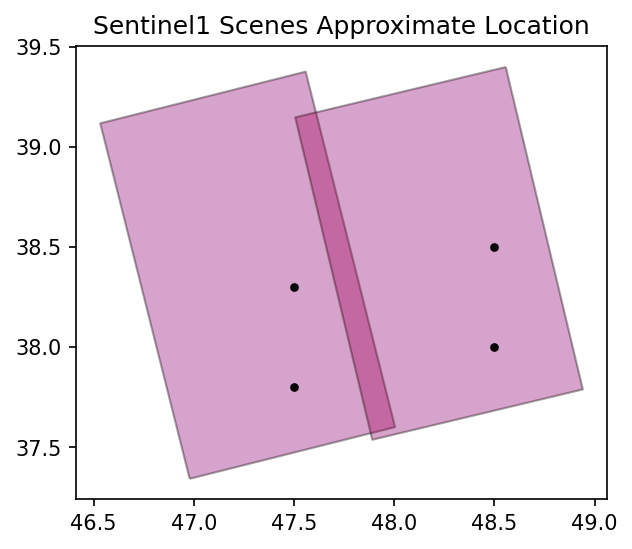

In [156]:
plt.figure(figsize=(8,4), dpi=150)
gdf =sbas.to_dataframe()
cmap = plt.cm.get_cmap('bwr', len(gdf.index.unique()))
colors = dict([(v,cmap(k)) for k,v in enumerate(gdf.index.unique())])
gdf.reset_index().plot(color=[colors[k] for k in gdf.index], alpha=0.2, edgecolor='black', ax=plt.gca())
plt.scatter(x=sbas.get_pins()[::2], y=sbas.get_pins()[1::2], color='black', s=10)
plt.title('Sentinel1 Scenes Approximate Location', fontsize=12)
plt.show()

### Interactive Plot

Be careful because interactive plots require more RAM to be visualized

The plots below do not work on Debian 10 and Python 3.7

In [157]:
plots = None
if USE_INTERACTIVE_PLOTS:
    opts_common = {'x':'lon', 'y':'lat', 'geo':True, 'width':800, 'height':600}
    opts1 = {'tiles':gstiles, 'alpha':0.4, 'title': 'Sentinel1 Scenes Approximate Location'}
    plots = sbas.to_dataframe().reset_index().hvplot(color='date', **{**opts_common, **opts1}) \
        * pd.DataFrame({'x': sbas.get_pins()[::2], 'y': sbas.get_pins()[1::2]}).hvplot.points(y='y', x='x', c='black', geo=True)
plots

### Crop the Frame (Optional)

When we satisfied with the pins positions and the target frame we are ready to crop the frame.
Just comment the code cell below when you don't need to crop the area.

In [158]:
sbas.reframe_parallel()

Reframing:   0%|          | 0/4 [00:00<?, ?it/s]

### Show the updated dataset (Optional)

The newly created scene frames .tiff and .xml files plus orbit files .EOF can be copied for the future processing using `SBAS.backup()` function to use them instead of the original full scenes.

In [159]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-02-07,2020-02-07 14:44:56,A,S1A,VV,1,raw_ardabil/s1a-iw1-slc-vv-20200207t144456-20200207t144507-031148-03949f-004.tiff,raw_ardabil/s1a-iw1-slc-vv-20200207t144456-20200207t144507-031148-03949f-004.xml,raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((46.97947 37.34370, 48.00482 37.60160, 47.55855 39.37586, 46.53320 39.11796, 46.97947 37.34370))"
2020-02-07,2020-02-07 14:44:57,A,S1A,VV,2,raw_ardabil/s1a-iw2-slc-vv-20200207t144457-20200207t144508-031148-03949f-005.tiff,raw_ardabil/s1a-iw2-slc-vv-20200207t144457-20200207t144508-031148-03949f-005.xml,raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((48.55726 39.39881, 47.50640 39.14765, 47.89097 37.53859, 48.94183 37.78975, 48.55726 39.39881))"
2020-02-19,2020-02-19 14:44:56,A,S1A,VV,1,raw_ardabil/s1a-iw1-slc-vv-20200219t144456-20200219t144507-031323-039aac-004.tiff,raw_ardabil/s1a-iw1-slc-vv-20200219t144456-20200219t144507-031323-039aac-004.xml,raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((46.97911 37.34339, 48.00444 37.60131, 47.55813 39.37557, 46.53280 39.11765, 46.97911 37.34339))"
2020-02-19,2020-02-19 14:44:57,A,S1A,VV,2,raw_ardabil/s1a-iw2-slc-vv-20200219t144457-20200219t144508-031323-039aac-005.tiff,raw_ardabil/s1a-iw2-slc-vv-20200219t144457-20200219t144508-031323-039aac-005.xml,raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((48.55685 39.39841, 47.50601 39.14723, 47.89063 37.53817, 48.94147 37.78935, 48.55685 39.39841))"


### Download SRTM DEM

The function below downloads SRTM1 or SRTM3 DEM and converts heights to ellipsoidal model using EGM96 grid.
Besides, for faster processing we can use pre-defined DEM file as explained above.

SRTM1 product is 30m resolution DEM and SRTM3 is 90m. SRTM1 is much bigger (~10 times) and is usable for small areas. Mainly 90m SRTM3 is the right choice. Use parameter resolution_meters (60 meters by default) to interpolate the DEM to required resolution for the future processing and output.

The DEM grid is NetCDF file.

In [160]:
sbas.download_dem(backend='GMT')

DEM Downloading:   0%|          | 0/1 [00:00<?, ?it/s]

### Static Plots

INFO:distributed.utils_perf:full garbage collection released 173.82 MiB from 20495 reference cycles (threshold: 9.54 MiB)


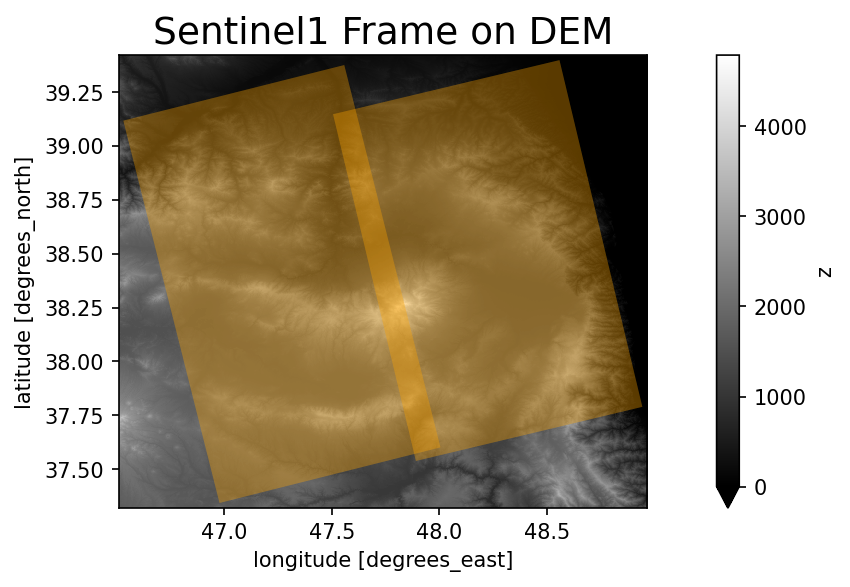

In [161]:
plt.figure(figsize=(12,4), dpi=150)
dem = sbas.get_dem()
dem[::4,::4].plot.imshow(cmap='gray', vmin=0)
sbas.to_dataframe().plot(color='orange', alpha=0.2, ax=plt.gca())
plt.title('Sentinel1 Frame on DEM', fontsize=18)
plt.show()

### Interactive Plot

Be careful because interactive plots require more RAM to be visualized

The plots below do not work on Debian 10 and Python 3.7

In [162]:
plots = None
if USE_INTERACTIVE_PLOTS:
    title = 'Subswath Topo'
    plots = sbas.get_dem()[::4,::4].hvplot(invert=False, cmap='gray', alpha=1, title=title) \
        * sbas.to_dataframe().reset_index().hvplot(color='date', alpha=0.2)
plots

## Align a Pair of Images

In [163]:
sbas.stack_parallel()

Reference:   0%|          | 0/2 [00:00<?, ?it/s]

Aligning:   0%|          | 0/2 [00:00<?, ?it/s]

## DEM in Radar Coordinates

In [164]:
sbas.topo_ra_parallel()

Radar Transform Computing sw1:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

INFO:distributed.scheduler:Receive client connection: Client-worker-868d623d-bfed-11ed-b144-0242ac1c000c
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:38354
INFO:distributed.scheduler:Receive client connection: Client-worker-9b83100b-bfed-11ed-b146-0242ac1c000c
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:34134


Radar Transform Computing sw2:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Analyze Transform Blocks:   0%|          | 0/15 [00:00<?, ?it/s]

Radar Topography Computing sw1:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Analyze Transform Blocks:   0%|          | 0/15 [00:00<?, ?it/s]

Radar Topography Computing sw2:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

### Load Grids

The grids are NetCDF files processing as xarray DataArrays.

In [165]:
topo_ra = sbas.get_topo_ra()

### Static Plot

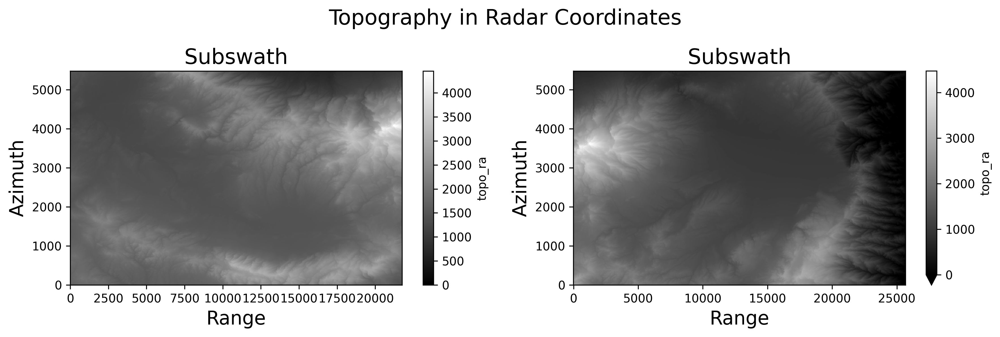

In [166]:
fig = plt.figure(figsize=(12,4), dpi=300)

subswaths = len(topo_ra)
for subswath in range(subswaths):
    ax = fig.add_subplot(1, subswaths, subswath + 1)
    topo_ra[subswath][::4,::4].plot.imshow(cmap='gray', vmin=0, ax=ax)
    plt.xlabel('Range', fontsize=16)
    plt.ylabel('Azimuth', fontsize=16)
    plt.title('Subswath', fontsize=18)

plt.suptitle('Topography in Radar Coordinates', fontsize=18)
plt.tight_layout()
plt.show()

### Interactive Plot

Be careful because interactive plots require more RAM to be visualized

The plots below do not work on Debian 10 and Python 3.7

In [167]:
plots = None
if USE_INTERACTIVE_PLOTS:
    subswaths = len(topo_ra)
    plot_opts = {'rasterize': True, 'xlabel':'Range', 'ylabel':'Azimuth', 'width':int(900/subswaths), 'height':300}
    for subswath in range(subswaths):
        plot = topo_ra[subswath][::4,::4].hvplot(cmap='terrain', title='Subswath Topo in Radar Coordinates', **plot_opts)
        plots = plots + plot if plots is not None else plot
plots

## Interferogram

Define a single interferogram or a SBAS series. Make direct and reverse interferograms (from past to future or from future to past).

Decimation is useful to save disk space. Geocoding results are always produced on the provided DEM grid so the output grid and resolution are the same to the DEM. By this way, ascending and descending orbit results are always defined on the same grid by design. The internal processing cells is about 15 x 15 meters size and for default output 60m resolution (like to GMTSAR and GAMMA software) decimation 4x4 is reasonable. For the default wavelength=200 for Gaussian filter 1/4 of wavelength is approximately equal to ~60 meters and better resolution is mostly useless (while it can be used for small objects detection). For wavelength=400 meters use 90m or 120m DEM resolution with decimation 6x6 or 8x8 and for wavelength=100 meters use decimation 2x2.

The grids are NetCDF files processing as xarray DataArrays.

In [168]:
# for a pair of scenes only two interferograms can be produced
# this one is selected for scenes sorted by the date in direct order
pairs = [sbas.to_dataframe().index.unique()]
pairs

[Index(['2020-02-07', '2020-02-19'], dtype='object', name='date')]

In [169]:
# use the DEM default resolution 60 m
decimator = sbas.pixel_decimator(resolution_meters=60, debug=True)

# use all the CPU cores when RAM amount is sufficient, like to Google Colab 12 GB RAM
# limit processing threads for Docker container 4 GB RAM
import psutil
n_jobs = 1 if psutil.virtual_memory().total/1e9 < 8 else -1

# default parameters: wavelength=200, psize=32, func=None (no postprocessing)
sbas.intf_parallel(pairs, func=decimator, n_jobs=n_jobs)

DEBUG: average per subswaths ground pixel size in meters: y=14.0, x=15.8
DEBUG: decimator = lambda da: da.coarsen({'y': 4, 'x': 4}, boundary='trim').mean()


Interferograms:   0%|          | 0/2 [00:00<?, ?it/s]

## Merge Subswaths (Optional)

That's the right time to merge subswath interferograms together before unwrapping them. While unwrapping is possible for separate subswath interferograms the merged interferogram unwrapping is more robust and returns better results when unconnected areas on separate subswaths are connected on the merged interferogram.

In [170]:
sbas.merge_parallel(pairs)

Merging Subswaths:   0%|          | 0/2 [00:00<?, ?it/s]

In [171]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-02-07,2020-02-07 14:44:56,A,S1A,VV,12,"[raw_ardabil/s1a-iw1-slc-vv-20200207t144456-20200207t144507-031148-03949f-004.tiff, raw_ardabil/s1a-iw2-slc-vv-20200207t144457-20200207t144508-031148-03949f-005.tiff]","[raw_ardabil/s1a-iw1-slc-vv-20200207t144456-20200207t144507-031148-03949f-004.xml, raw_ardabil/s1a-iw2-slc-vv-20200207t144457-20200207t144508-031148-03949f-005.xml]",raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((46.97947 37.34370, 46.53320 39.11796, 47.55855 39.37586, 47.60974 39.17234, 48.55726 39.39881, 48.94183 37.78975, 47.89097 37.53859, 47.88322 37.57102, 46.97947 37.34370))"
2020-02-19,2020-02-19 14:44:56,A,S1A,VV,12,"[raw_ardabil/s1a-iw1-slc-vv-20200219t144456-20200219t144507-031323-039aac-004.tiff, raw_ardabil/s1a-iw2-slc-vv-20200219t144457-20200219t144508-031323-039aac-005.tiff]","[raw_ardabil/s1a-iw1-slc-vv-20200219t144456-20200219t144507-031323-039aac-004.xml, raw_ardabil/s1a-iw2-slc-vv-20200219t144457-20200219t144508-031323-039aac-005.xml]",raw_ardabil/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((46.97911 37.34339, 46.53280 39.11765, 47.55813 39.37557, 47.60935 39.17193, 48.55685 39.39841, 48.94147 37.78935, 47.89063 37.53817, 47.88285 37.57073, 46.97911 37.34339))"


## Build Geocoding Matrices (Optional)

Source grid pixels can be translated to the target grid pixels very fast using the geocoding matrices.

In [172]:
sbas.geocode_parallel(pairs)

Radar Transform Computing sw12:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Analyze Transform Blocks:   0%|          | 0/32 [00:00<?, ?it/s]

Radar Topography Computing sw12:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Loading:   0%|          | 0/1 [00:00<?, ?it/s]

Analyze Transform Blocks:   0%|          | 0/32 [00:00<?, ?it/s]

Build ll2ra Transform:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Build ra2ll Transform:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

### Load Grids

The grids can be cropped automatically to drop empty areas around valid area (use crop_valid=True). On-the fly geocoding from radar to geographic coordinates is possible by geocode=True.

The grids are NetCDF files in radar coordinates processing as xarray DataArrays. For a single interferogramm processing convert the 3D stack to 2D grid using index [0].

In [173]:
phasefilt = sbas.open_grids(pairs, 'phasefilt', geocode=True, crop_valid=True)[0]
corr = sbas.open_grids(pairs, 'corr', geocode=True, crop_valid=True)[0]

Loading:   0%|          | 0/1 [00:00<?, ?it/s]

Loading:   0%|          | 0/1 [00:00<?, ?it/s]

### Static Plots

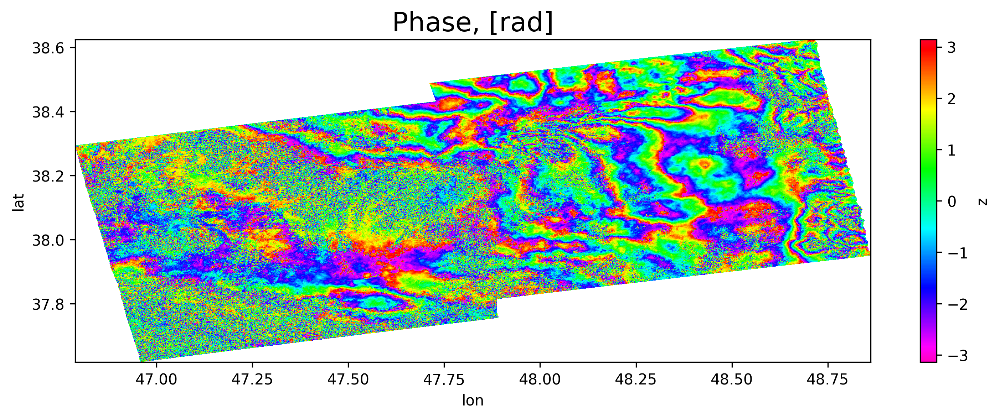

In [174]:
plt.figure(figsize=(12,4), dpi=300)
phasefilt.plot.imshow(vmin=-np.pi, vmax=np.pi, cmap='gist_rainbow_r')
plt.title('Phase, [rad]', fontsize=18)
plt.show()

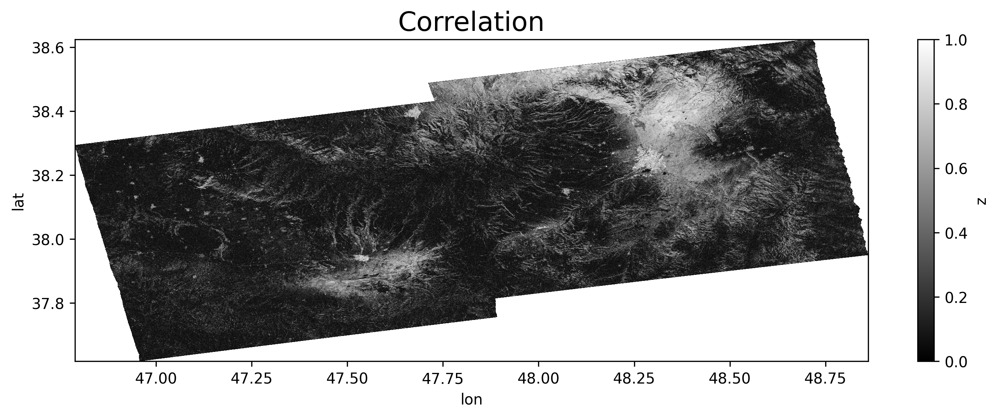

In [175]:
plt.figure(figsize=(12,4), dpi=300)
corr.plot.imshow(vmin=-0, vmax=1, cmap='gray')
plt.title('Correlation', fontsize=18)
plt.show()

### Interactive Plot

Be careful because interactive plots require more RAM to be visualized

The plots below do not work on Debian 10 and Python 3.7

In [176]:
plots = None
if USE_INTERACTIVE_PLOTS:
    opts_common = {'x':'lon', 'y':'lat', 'geo':True, 'width':800, 'height':600, 'colorbar':True, 'padding':0}
    opts1 = {'tiles':gstiles, 'alpha':0.4, 'cmap':'gist_rainbow_r', 'clim':(-np.pi, np.pi),
            'title': f'Sentinel-1 Interferogram [rad] Co-Seismic Pair {pairs[0][0]} - {pairs[0][1]}'}
    plots = phasefilt.hvplot(**{**opts_common, **opts1})
plots

## Unwrapping

Unwrapping process requires a lot of RAM and that's really RAM consuming when a lot of parallel proccesses running togeter. To limit the parallel processing tasks apply argument "n_jobs". The default value n_jobs=-1 means all the processor cores van be used. Also, use interferogram decimation above to produce smaller interferograms. And in addition a custom SNAPHU configuration can reduce RAM usage as explained below.

Attention: in case of crash on MacOS Apple Silicon run Jupyter as

`OBJC_DISABLE_INITIALIZE_FORK_SAFETY=YES no_proxy='*' jupyter notebook`

### Unwrapping Post-Processing

Define post-processing function to exclude low-coherence areas and maybe fill them by nearest neighbour interpolation.

In [177]:
# define a post-processing function to crop low-coherence areas
cleaner = lambda corr, unwrap: xr.where(corr>=CORRLIMIT, unwrap, np.nan)

# define a post-processing function to crop and interpolate low-coherence areas
#cleaner = lambda corr, unwrap: sbas.nearest_grid(xr.where(corr>=CORRLIMIT, unwrap, np.nan))

### Generate Custom SNAPHU Config

Default SNAPHU configuration allows to run multiple unwrapping tasks in parallel. At the same time, for a single interferogram processing or large interferograms unwrapping SNAPHU tiling can decrease the both processing time and RAM comsumption. Be careful to prevent unconnected zones on the tiles when a high coherency area is fully arounded by low-coherent buffer on some tiles (redefine tiles or increase tiles row and column overlapping parameters ROWOVRLP and COLOVRLP).

In [178]:
# use NPROC parameter to define number of cores for the processing, by default all the cores used
conf = sbas.snaphu_config(defomax=DEFOMAX, NTILEROW=1, NTILECOL=2, ROWOVRLP=200, COLOVRLP=200)

In [179]:
# check the generated SNAPHU config and tune the SNAPHU parameters above if needed.
print ('SNAPHU custom config generated:')
print (conf)

SNAPHU custom config generated:

        # basic config
        INFILEFORMAT   FLOAT_DATA
        OUTFILEFORMAT  FLOAT_DATA
        AMPFILEFORMAT  FLOAT_DATA
        CORRFILEFORMAT FLOAT_DATA
        ALTITUDE       693000.0
        EARTHRADIUS    6378000.0
        NEARRANGE      831000
        DR             18.4
        DA             28.2
        RANGERES       28
        AZRES          44
        LAMBDA         0.0554658
        NLOOKSRANGE    1
        NLOOKSAZ       1
        TILEDIR        raw_ardabil/S1_20200207_ALL_F12_snaphu_tiledir
        NPROC          2
        # custom config
        DEFOMAX_CYCLE 0



### Simple Interferogram Unwrapping

SNAPHU unwrapper allows to split large scene to tiles for parallel processing and accurately enough merge the tiles to a single image. That's especially helpful to unwrap a single interferogram using all the processor cores and save RAM consumption drastically.

In [180]:
# unwrap each interferogram simultaneously on all the avaibalbe processor cores
#sbas.unwrap_parallel(pairs, threshold=CORRLIMIT, func=cleaner)

### Custom Interferogram Unwrapping

SNAPHU unwrapper allows to split large scene to tiles for parallel processing and accurately enough merge the tiles to a single image. That's especially helpful to unwrap a single interferogram using all the processor cores and save RAM consumption drastically.

In [181]:
# "FileNotFoundError" SNAPHU error means the processing is not completed normally for some tiles
# try again with different SNAPHU parameters

if platform.system() == 'Darwin':
    # run only one unwrapping task at the time because the custom SNAPHU configuration uses all the cores
    sbas.unwrap_parallel(pairs, n_jobs=1, threshold=CORRLIMIT, func=cleaner, conf=conf)
else:
    # on Google Colab use default configuration
    sbas.unwrap_parallel(pairs, n_jobs=1, threshold=CORRLIMIT, func=cleaner)

Unwrapping:   0%|          | 0/1 [00:00<?, ?it/s]

### Load Grid

The grids can be cropped automatically to drop empty areas around valid area. Use `open_grids(..., crop_valid=True)` to enable the auto cropping feature. Argument geocode=True means on-the-fly geocoding from radar to geographic coordinates (all the grids saved on disk in radar coordinates plus geocoding matrices are generated for the fast geocoding). For a single interferogramm processing convert the 3D stack to 2D grid using index [0].

In [182]:
unwrap = sbas.open_grids(pairs, 'unwrap', geocode=True, crop_valid=True)[0]

Loading:   0%|          | 0/1 [00:00<?, ?it/s]

### Static Plot

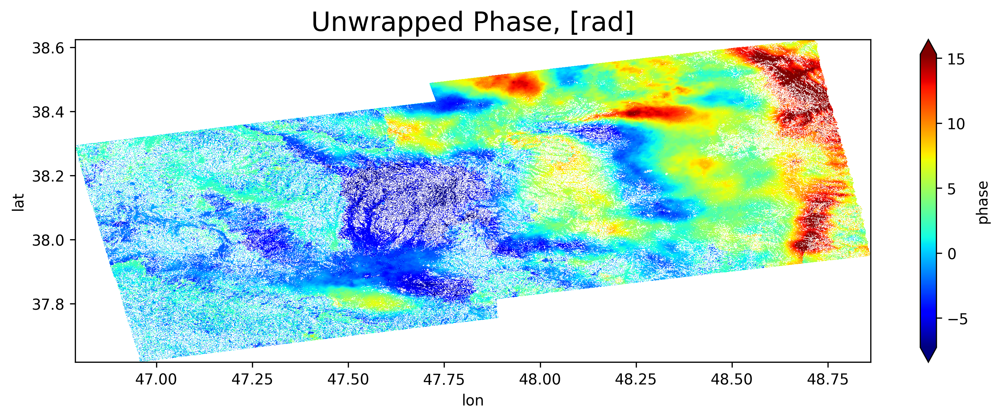

In [183]:
plt.figure(figsize=(12,4), dpi=300)
zmin, zmax = np.nanquantile(unwrap, [0.01, 0.99])
unwrap.plot.imshow(vmin=zmin, vmax=zmax, cmap='jet')
plt.title('Unwrapped Phase, [rad]', fontsize=18)
plt.show()

### Interactive Plot

Be careful because interactive plots require more RAM to be visualized

The plots below do not work on Debian 10 and Python 3.7

In [184]:
plots = None
if USE_INTERACTIVE_PLOTS:
    opts_common = {'x':'lon', 'y':'lat', 'geo':True, 'width':800, 'height':600, 'colorbar':True, 'padding':0}
    opts2 = {'tiles':gstiles, 'alpha':0.5, 'cmap':'turbo', 'clim':(zmin, zmax),
             'title': f'Sentinel-1 Unwrapped Phase [rad] Co-Seismic Pair {pairs[0][0]} - {pairs[0][1]}'}
    plots = unwrap.hvplot(**{**opts_common, **opts2})
plots

## Detrend

In [185]:
sbas.detrend_parallel(pairs, wavelength=12000)

Detrending and Saving:   0%|          | 0/1 [00:00<?, ?it/s]

## Load Grid

In [186]:
unwraps_detrend = sbas.open_grids(pairs, 'detrend')[0]

Loading:   0%|          | 0/1 [00:00<?, ?it/s]

## Static Plot

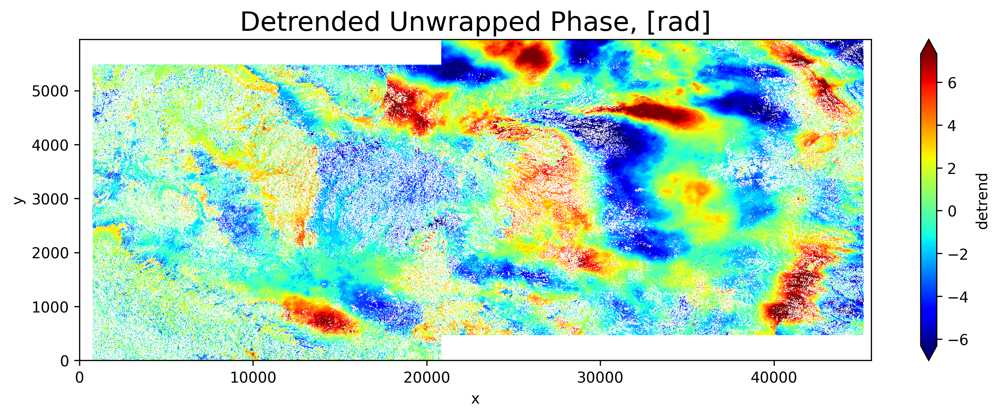

In [187]:
plt.figure(figsize=(12,4), dpi=300)
zmin, zmax = np.nanquantile(unwraps_detrend, [0.01, 0.99])
unwraps_detrend.plot.imshow(vmin=zmin, vmax=zmax, cmap='jet')
plt.title('Detrended Unwrapped Phase, [rad]', fontsize=18)
plt.show()

## LOS Displacement

### Load and Calculate Grid

The grids can be post-processed using user-defined function "func". SBAS function `los_displacement_mm()` converts unwrapped phase values to LOS displacement in millimeters. For a single interferogramm processing convert the 3D stack to 2D grid using index [0].

In [188]:
los_disp_mm = sbas.open_grids(pairs, 'detrend', func=sbas.los_displacement_mm, geocode=True, crop_valid=True)[0]

Loading:   0%|          | 0/1 [00:00<?, ?it/s]

### Static Plot

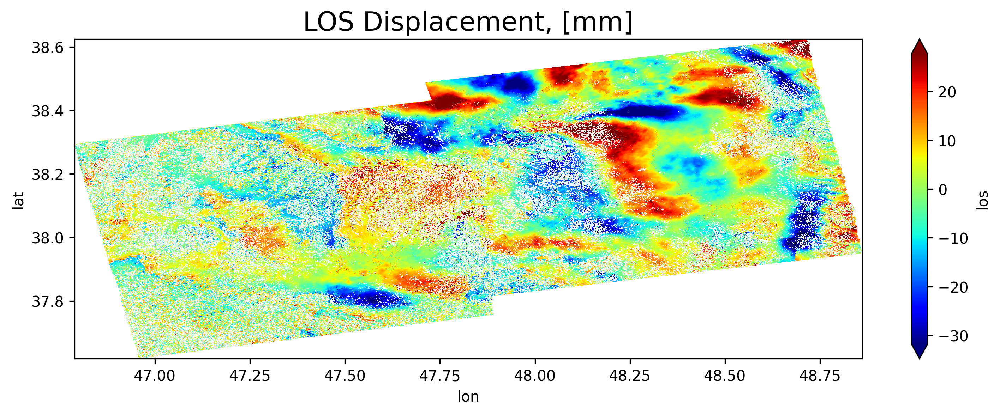

In [189]:
plt.figure(figsize=(12,4), dpi=300)
zmin, zmax = np.nanquantile(los_disp_mm, [0.01, 0.99])
los_disp_mm.plot.imshow(vmin=zmin, vmax=zmax, cmap='jet')
plt.title('LOS Displacement, [mm]', fontsize=18)
plt.show()

### Interactive Plot

Be careful because interactive plots require more RAM to be visualized

The plots below do not work on Debian 10 and Python 3.7

In [190]:
plots = None
if USE_INTERACTIVE_PLOTS:
    opts_common = {'x':'lon', 'y':'lat', 'geo':True, 'width':800, 'height':600, 'colorbar':True, 'padding':0}
    opts2 = {'tiles':gstiles, 'alpha':0.5, 'cmap':'turbo', 'clim':(zmin, zmax),
             'title': f'Sentinel-1 LOS Displacement [mm] Co-Seismic Pair {pairs[0][0]} - {pairs[0][1]}'}
    plots = los_disp_mm.hvplot(**{**opts_common, **opts2})
plots

## Measure Maximum and Minimum LOS Displacement, [mm]

In [191]:
np.array(los_disp_mm.min().round()), np.array(los_disp_mm.max().round())

(array(-71., dtype=float32), array(57., dtype=float32))

## Save the Results

Save the results in geospatial data formats like to NetCDF, GeoTIFF and others. The both formats (NetCDF and GeoTIFF) can be opened in QGIS and other GIS applications.

In [192]:
# define the filenames for phase, correlation, LOS displacement
phasefilt_filename = f'phasefilt_iw{SUBSWATH}_{POLARIZATION}_{ORBIT}.nc'
corr_filename = f'corr_iw{SUBSWATH}_{POLARIZATION}_{ORBIT}.nc'
displacement_filename = f'los_disp_mm_iw{SUBSWATH}_{POLARIZATION}_{ORBIT}.nc'

# save the results
phasefilt.to_netcdf(phasefilt_filename, engine=sbas.engine)
corr.to_netcdf(corr_filename, engine=sbas.engine)
los_disp_mm.to_netcdf(displacement_filename, engine=sbas.engine)

### Export from Google Colab 

In [193]:
if 'google.colab' in sys.modules:
    from google.colab import files
    files.download(phasefilt_filename)
    files.download(corr_filename)
    files.download(displacement_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Backup Pre-Processed Data

Save the stitched and cropped scenes and downloaded DEM and orbit files to a new directory using `SBAS.backup(dir)` command and load the dataset later as `SBAS(dir, 'dir/DEM_WGS84.nc', basedir=WORKDIR)` Do not forgot to download the backup to use it later.

In [194]:
if DATADIR != 'backup':
    print ('Create backup to use it for the next reproducible runs without the original scenes downloading')
    sbas.backup('backup')

Create backup to use it for the next reproducible runs without the original scenes downloading


In [195]:
!ls backup

DEM_WGS84.nc
s1a-iw1-slc-vv-20200207t144456-20200207t144507-031148-03949f-004.tiff
s1a-iw1-slc-vv-20200207t144456-20200207t144507-031148-03949f-004.xml
s1a-iw1-slc-vv-20200219t144456-20200219t144507-031323-039aac-004.tiff
s1a-iw1-slc-vv-20200219t144456-20200219t144507-031323-039aac-004.xml
s1a-iw2-slc-vv-20200207t144457-20200207t144508-031148-03949f-005.tiff
s1a-iw2-slc-vv-20200207t144457-20200207t144508-031148-03949f-005.xml
s1a-iw2-slc-vv-20200219t144457-20200219t144508-031323-039aac-005.tiff
s1a-iw2-slc-vv-20200219t144457-20200219t144508-031323-039aac-005.xml
S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF
S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF


## Conclusion

For now you have the full control on interferometry processing and unwrapping and able to run it everywhere: on free of charge Google Colab instances, on local MacOS and Linux computers and on Amazon EC2 and Google Cloud VM and AI Notebook instances.